# Compare BetaVAE models

In [3]:
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from specvae import utils

In [4]:
def load_experiment_from_path(filepath):
    return pd.read_csv(filepath, index_col=0)

def load_experiment(dataset, experiment_name, filename='experiment.csv', base_path=None):
    if base_path is None:
        filepath = utils.get_project_path() / '.model' / dataset / experiment_name / filename
    else:
        filepath = base_path / dataset / experiment_name / filename
    return load_experiment_from_path(filepath)

def load_experiment_sessions(dataset, experiment_name, filenames=['experiment.csv'], base_path=None):
    dfs = [load_experiment(dataset, experiment_name, filename, base_path) for filename in filenames]
    merged_df = pd.concat(dfs, ignore_index=True)
    return merged_df

In [5]:
indices = [0, 1, 2]
df = load_experiment_sessions('MoNA', 'betavae_capacity_nextron', 
    ['experiment01_dms.csv', 'experiment02_dms.csv', 'experiment03_dms.csv', 
     'experiment04_dms.csv', 'experiment05_dms.csv', 'experiment06_dms.csv'])
# df2 = load_experiment_sessions('HMDB', 'betavae_capacity_nextron', 
#     ['experiment01.csv', 'experiment02.csv', 'experiment03.csv', 'experiment04.csv', 
#      'experiment05.csv', 'experiment06.csv'])
# df = pd.concat([df1, df2], ignore_index=True)
df.to_csv(utils.get_project_path() / '.model' / 'betavae_mona.csv')
df

,name,dataset,full_model_name,layer_config,input_columns,param_latent_dim,param_beta,param_limit,param_dropout,param_max_mz,...,"m.eval.factor_vae.(1, 0, 2)","m.eval.factor_vae.(1, 2, 0)","m.eval.factor_vae.(2, 0, 1)","m.eval.factor_vae.(2, 1, 0)","m.eval.mig.(0, 1, 2)","m.eval.mig.(0, 2, 1)","m.eval.mig.(1, 0, 2)","m.eval.mig.(1, 2, 0)","m.eval.mig.(2, 0, 1)","m.eval.mig.(2, 1, 0)"
0,betavae_capacity,MoNA,betavae_capacity_20-1600-3-1600-20_01 (24-12-2...,"[[20, 1600, 3], [3, 1600, 20]]",['spectrum'],3,0.01,1.0,0.0,2500.0,...,0.4252,0.4118,0.3998,0.4178,0.017615,0.021728,0.018783,0.022494,0.017946,0.017626
1,betavae_capacity,MoNA,betavae_capacity_20-800-3-800-20_01 (24-12-202...,"[[20, 800, 3], [3, 800, 20]]",['spectrum'],3,0.01,1.0,0.0,2500.0,...,0.3946,0.3870,0.3882,0.3858,0.014543,0.014324,0.014848,0.013696,0.011159,0.016416
2,betavae_capacity,MoNA,betavae_capacity_20-400-3-400-20_01 (24-12-202...,"[[20, 400, 3], [3, 400, 20]]",['spectrum'],3,0.01,1.0,0.0,2500.0,...,0.3658,0.3748,0.3694,0.3704,0.015918,0.020042,0.013602,0.015101,0.011038,0.012730
3,betavae_capacity,MoNA,betavae_capacity_20-200-3-200-20_01 (24-12-202...,"[[20, 200, 3], [3, 200, 20]]",['spectrum'],3,0.01,1.0,0.0,2500.0,...,0.4146,0.4154,0.4538,0.4102,0.008990,0.009510,0.007055,0.013227,0.009701,0.010610
4,betavae_capacity,MoNA,betavae_capacity_20-100-3-100-20_01 (24-12-202...,"[[20, 100, 3], [3, 100, 20]]",['spectrum'],3,0.01,1.0,0.0,2500.0,...,0.3696,0.3684,0.3728,0.3702,0.019305,0.020460,0.020895,0.015692,0.022397,0.019964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
691,betavae_capacity,MoNA,betavae_capacity_200-800-100-3-800-200_06 (24-...,"[[200, 800, 100, 3], [3, 800, 200]]",['spectrum'],3,2.00,1.0,0.0,2500.0,...,0.4550,0.4028,0.4092,0.4086,0.004568,0.005922,0.007478,0.005929,0.011063,0.007986
692,betavae_capacity,MoNA,betavae_capacity_200-400-100-3-400-200_06 (24-...,"[[200, 400, 100, 3], [3, 400, 200]]",['spectrum'],3,2.00,1.0,0.0,2500.0,...,0.3786,0.3802,0.3782,0.3644,0.033861,0.032677,0.031942,0.034295,0.028728,0.033870
693,betavae_capacity,MoNA,betavae_capacity_200-200-100-3-200-200_06 (24-...,"[[200, 200, 100, 3], [3, 200, 200]]",['spectrum'],3,2.00,1.0,0.0,2500.0,...,0.3680,0.3812,0.3526,0.3760,0.021807,0.026936,0.024629,0.024334,0.025476,0.021105
694,betavae_capacity,MoNA,betavae_capacity_200-100-90-3-100-200_06 (24-1...,"[[200, 100, 90, 3], [3, 100, 200]]",['spectrum'],3,2.00,1.0,0.0,2500.0,...,0.3914,0.3874,0.3992,0.4096,0.012846,0.015058,0.013186,0.013496,0.015773,0.015467


In [30]:
columns = list(df.columns)
params = list(filter(lambda x: x.startswith('param_'), columns))
values = list(filter(lambda x: x.startswith('m_'), columns))
others = list(filter(lambda x: not x.startswith('m_') and not x.startswith('param_'), columns))
# Separate by split:
train_values = list(filter(lambda x: x.startswith('m_train_'), columns))
valid_values = list(filter(lambda x: x.startswith('m_valid_'), columns))
test_values = list(filter(lambda x: x.startswith('m_test_'), columns))

In [31]:
import ast
def is_symmetric(row):
    layer_config = ast.literal_eval(row['layer_config'])
    return len(layer_config[0]) == len(layer_config[1])

def depth(row):
    layer_config = ast.literal_eval(row['layer_config'])
    lencoder, ldecoder = len(layer_config[0]) - 2, len(layer_config[1]) - 2
    return max(lencoder, ldecoder)

df['is_symmetric'] = df.apply(is_symmetric, axis=1)
df['depth'] = df.apply(depth, axis=1)


### Add random disentanglement scores for testing

In [32]:
# import itertools as it
# pcols =  ['m.train.factor_vae.'       + str(p) for p in it.permutations(indices, len(indices))]
# pcols += ['m.valid.beta_vae.'       + str(p) for p in it.permutations(indices, len(indices))]
# pcols += ['m.train.factor_vae.'     + str(p) for p in it.permutations(indices, len(indices))]
# pcols += ['m.valid.factor_vae.'     + str(p) for p in it.permutations(indices, len(indices))]
# pcols += ['m.train.mig.'            + str(p) for p in it.permutations(indices, len(indices))]
# pcols += ['m.valid.mig.'            + str(p) for p in it.permutations(indices, len(indices))]

# def random_score(row):
#     for n in pcols:
#         row[n] = np.random.random()
#     return row
# df = df.apply(random_score, axis=1)

### Prepare scores

In [33]:
import itertools as it
def prepare_scores(df, indices=[0,1,2]):
    def unpivot_by_name(df, score_name):
        def split(row):
            if 'train' in row['permutation']:
                row['permutation'] = row['permutation'].replace('m.train.' + score_name + '.', '')
                row['split'] = 'train'
            elif 'eval' in row['permutation']:
                row['permutation'] = row['permutation'].replace('m.eval.' + score_name + '.', '')
                row['split'] = 'valid'
            return row
        vars = ['m.train.' + score_name + '.' + str(p) for p in it.permutations(indices, len(indices))] + \
                ['m.eval.' + score_name + '.' + str(p) for p in it.permutations(indices, len(indices))]
        df1 = df.melt(id_vars=['full_model_name'], value_vars=vars, var_name='permutation', value_name=score_name)
        df1 = df1.apply(split, axis=1)
        return df1
    df1 = unpivot_by_name(df, 'beta_vae')
    df2 = unpivot_by_name(df, 'factor_vae')
    df3 = unpivot_by_name(df, 'mig')
    df_ = pd.merge(df1, df2, on=['full_model_name', 'split', 'permutation'])
    df_ = pd.merge(df_, df3, on=['full_model_name', 'split', 'permutation'])
    df_ = pd.merge(df_, df, on=['full_model_name'])
    return df_


In [34]:
df1 = prepare_scores(df, indices)
df1

,full_model_name,permutation,beta_vae,split,factor_vae,mig,name,dataset,layer_config,input_columns,...,"m.eval.factor_vae.(2, 0, 1)","m.eval.factor_vae.(2, 1, 0)","m.eval.mig.(0, 1, 2)","m.eval.mig.(0, 2, 1)","m.eval.mig.(1, 0, 2)","m.eval.mig.(1, 2, 0)","m.eval.mig.(2, 0, 1)","m.eval.mig.(2, 1, 0)",is_symmetric,depth
0,betavae_capacity_20-1600-3-1600-20_01 (24-12-2021_00-17-31),"(0, 1, 2)",0.5877,train,0.4119,0.017615,betavae_capacity,MoNA,"[[20, 1600, 3], [3, 1600, 20]]",['spectrum'],...,0.3998,0.4178,0.017615,0.021728,0.018783,0.022494,0.017946,0.017626,True,1
1,betavae_capacity_20-1600-3-1600-20_01 (24-12-2021_00-17-31),"(0, 2, 1)",0.5955,train,0.4339,0.021728,betavae_capacity,MoNA,"[[20, 1600, 3], [3, 1600, 20]]",['spectrum'],...,0.3998,0.4178,0.017615,0.021728,0.018783,0.022494,0.017946,0.017626,True,1
2,betavae_capacity_20-1600-3-1600-20_01 (24-12-2021_00-17-31),"(1, 0, 2)",0.5895,train,0.4284,0.018783,betavae_capacity,MoNA,"[[20, 1600, 3], [3, 1600, 20]]",['spectrum'],...,0.3998,0.4178,0.017615,0.021728,0.018783,0.022494,0.017946,0.017626,True,1
3,betavae_capacity_20-1600-3-1600-20_01 (24-12-2021_00-17-31),"(1, 2, 0)",0.5867,train,0.4203,0.022494,betavae_capacity,MoNA,"[[20, 1600, 3], [3, 1600, 20]]",['spectrum'],...,0.3998,0.4178,0.017615,0.021728,0.018783,0.022494,0.017946,0.017626,True,1
4,betavae_capacity_20-1600-3-1600-20_01 (24-12-2021_00-17-31),"(2, 0, 1)",0.5916,train,0.4087,0.017946,betavae_capacity,MoNA,"[[20, 1600, 3], [3, 1600, 20]]",['spectrum'],...,0.3998,0.4178,0.017615,0.021728,0.018783,0.022494,0.017946,0.017626,True,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8347,betavae_capacity_200-50-40-3-50-200_06 (24-12-2021_15-02-27),"(0, 2, 1)",0.6246,valid,0.3894,0.007209,betavae_capacity,MoNA,"[[200, 50, 40, 3], [3, 50, 200]]",['spectrum'],...,0.3762,0.3718,0.006834,0.007209,0.010683,0.007889,0.008512,0.009460,False,2
8348,betavae_capacity_200-50-40-3-50-200_06 (24-12-2021_15-02-27),"(1, 0, 2)",0.6118,valid,0.3688,0.010683,betavae_capacity,MoNA,"[[200, 50, 40, 3], [3, 50, 200]]",['spectrum'],...,0.3762,0.3718,0.006834,0.007209,0.010683,0.007889,0.008512,0.009460,False,2
8349,betavae_capacity_200-50-40-3-50-200_06 (24-12-2021_15-02-27),"(1, 2, 0)",0.6192,valid,0.3942,0.007889,betavae_capacity,MoNA,"[[200, 50, 40, 3], [3, 50, 200]]",['spectrum'],...,0.3762,0.3718,0.006834,0.007209,0.010683,0.007889,0.008512,0.009460,False,2
8350,betavae_capacity_200-50-40-3-50-200_06 (24-12-2021_15-02-27),"(2, 0, 1)",0.6240,valid,0.3762,0.008512,betavae_capacity,MoNA,"[[200, 50, 40, 3], [3, 50, 200]]",['spectrum'],...,0.3762,0.3718,0.006834,0.007209,0.010683,0.007889,0.008512,0.009460,False,2


## Top models

In [35]:
pd.set_option("display.max_colwidth", 200)
pd.set_option('display.max_rows', 200)

### Best models w.r.t. beta_vae score grouped by beta, n_peaks and permutation

In [36]:
df1[['param_beta', 'param_max_num_peaks', 'permutation', 'layer_config', 'full_model_name', 
    'beta_vae', 'factor_vae', 'mig',
    'm_train_cos_sim', 'm_train_eu_dist', 'm_train_per_diff']].loc[
    df1.groupby(['param_beta', 'param_max_num_peaks', 'permutation'])['beta_vae'].idxmax()]

,param_beta,param_max_num_peaks,permutation,layer_config,full_model_name,beta_vae,factor_vae,mig,m_train_cos_sim,m_train_eu_dist,m_train_per_diff
24,0.01,10,"(0, 1, 2)","[[20, 400, 3], [3, 400, 20]]",betavae_capacity_20-400-3-400-20_01 (24-12-2021_00-32-08),0.6365,0.4015,0.015918,0.992160,0.144675,0.439264
25,0.01,10,"(0, 2, 1)","[[20, 400, 3], [3, 400, 20]]",betavae_capacity_20-400-3-400-20_01 (24-12-2021_00-32-08),0.6437,0.3634,0.020042,0.992160,0.144675,0.439264
26,0.01,10,"(1, 0, 2)","[[20, 400, 3], [3, 400, 20]]",betavae_capacity_20-400-3-400-20_01 (24-12-2021_00-32-08),0.6305,0.3858,0.013602,0.992160,0.144675,0.439264
33,0.01,10,"(1, 2, 0)","[[20, 400, 3], [3, 400, 20]]",betavae_capacity_20-400-3-400-20_01 (24-12-2021_00-32-08),0.6364,0.3748,0.015101,0.992160,0.144675,0.439264
28,0.01,10,"(2, 0, 1)","[[20, 400, 3], [3, 400, 20]]",betavae_capacity_20-400-3-400-20_01 (24-12-2021_00-32-08),0.6328,0.3663,0.011038,0.992160,0.144675,0.439264
335,0.01,10,"(2, 1, 0)","[[20, 100, 90, 3], [3, 100, 20]]",betavae_capacity_20-100-90-3-100-20_01 (24-12-2021_03-48-35),0.6366,0.3574,0.030438,0.992503,0.141274,0.381296
462,0.01,25,"(0, 1, 2)","[[50, 200, 100, 3], [3, 100, 200, 50]]",betavae_capacity_50-200-100-3-100-200-50_01 (24-12-2021_05-11-30),0.6608,0.3434,0.041025,0.987032,0.200712,0.335517
529,0.01,25,"(0, 2, 1)","[[50, 100, 90, 50, 3], [3, 50, 90, 100, 50]]",betavae_capacity_50-100-90-50-3-50-90-100-50_01 (24-12-2021_06-02-35),0.6596,0.4430,0.009889,0.987750,0.194853,0.351631
536,0.01,25,"(1, 0, 2)","[[50, 100, 90, 50, 3], [3, 50, 90, 100, 50]]",betavae_capacity_50-100-90-50-3-50-90-100-50_01 (24-12-2021_06-02-35),0.6682,0.4336,0.007059,0.987750,0.194853,0.351631
531,0.01,25,"(1, 2, 0)","[[50, 100, 90, 50, 3], [3, 50, 90, 100, 50]]",betavae_capacity_50-100-90-50-3-50-90-100-50_01 (24-12-2021_06-02-35),0.6609,0.4427,0.012161,0.987750,0.194853,0.351631


### Best models w.r.t. factor_vae score grouped by beta, n_peaks and permutation

In [37]:
df1[['param_beta', 'param_max_num_peaks', 'permutation', 'layer_config', 'full_model_name', 
    'beta_vae', 'factor_vae', 'mig',
    'm_train_cos_sim', 'm_train_eu_dist', 'm_train_per_diff']].loc[
    df1.groupby(['param_beta', 'param_max_num_peaks', 'permutation'])['factor_vae'].idxmax()]

,param_beta,param_max_num_peaks,permutation,layer_config,full_model_name,beta_vae,factor_vae,mig,m_train_cos_sim,m_train_eu_dist,m_train_per_diff
36,0.01,10,"(0, 1, 2)","[[20, 200, 3], [3, 200, 20]]",betavae_capacity_20-200-3-200-20_01 (24-12-2021_00-39-25),0.6100,0.4652,0.008990,0.991876,0.143254,0.440434
343,0.01,10,"(0, 2, 1)","[[20, 50, 40, 3], [3, 50, 20]]",betavae_capacity_20-50-40-3-50-20_01 (24-12-2021_03-56-08),0.5828,0.4850,0.007362,0.991534,0.145230,0.390817
344,0.01,10,"(1, 0, 2)","[[20, 50, 40, 3], [3, 50, 20]]",betavae_capacity_20-50-40-3-50-20_01 (24-12-2021_03-56-08),0.5856,0.4504,0.005390,0.991534,0.145230,0.390817
339,0.01,10,"(1, 2, 0)","[[20, 50, 40, 3], [3, 50, 20]]",betavae_capacity_20-50-40-3-50-20_01 (24-12-2021_03-56-08),0.5844,0.4553,0.006895,0.991534,0.145230,0.390817
316,0.01,10,"(2, 0, 1)","[[20, 200, 100, 3], [3, 200, 20]]",betavae_capacity_20-200-100-3-200-20_01 (24-12-2021_03-40-57),0.6117,0.4640,0.031655,0.992275,0.140010,0.371732
203,0.01,10,"(2, 1, 0)","[[20, 1600, 3], [3, 100, 1600, 20]]",betavae_capacity_20-1600-3-100-1600-20_01 (24-12-2021_02-25-02),0.5832,0.4776,0.022864,0.992820,0.137617,0.378545
534,0.01,25,"(0, 1, 2)","[[50, 100, 90, 50, 3], [3, 50, 90, 100, 50]]",betavae_capacity_50-100-90-50-3-50-90-100-50_01 (24-12-2021_06-02-35),0.6582,0.4506,0.016282,0.987750,0.194853,0.351631
397,0.01,25,"(0, 2, 1)","[[50, 100, 3], [3, 100, 50]]",betavae_capacity_50-100-3-100-50_01 (24-12-2021_04-33-05),0.5539,0.4550,0.018086,0.985207,0.211156,0.449705
530,0.01,25,"(1, 0, 2)","[[50, 100, 90, 50, 3], [3, 50, 90, 100, 50]]",betavae_capacity_50-100-90-50-3-50-90-100-50_01 (24-12-2021_06-02-35),0.6531,0.4437,0.007059,0.987750,0.194853,0.351631
537,0.01,25,"(1, 2, 0)","[[50, 100, 90, 50, 3], [3, 50, 90, 100, 50]]",betavae_capacity_50-100-90-50-3-50-90-100-50_01 (24-12-2021_06-02-35),0.6606,0.4478,0.012161,0.987750,0.194853,0.351631


### Best models w.r.t. MIG score grouped by beta, n_peaks and permutation

In [38]:
df1[['param_beta', 'param_max_num_peaks', 'permutation', 'layer_config', 'full_model_name', 
    'beta_vae', 'factor_vae', 'mig',
    'm_train_cos_sim', 'm_train_eu_dist', 'm_train_per_diff']].loc[
    df1.groupby(['param_beta', 'param_max_num_peaks', 'permutation'])['mig'].idxmax()]

,param_beta,param_max_num_peaks,permutation,layer_config,full_model_name,beta_vae,factor_vae,mig,m_train_cos_sim,m_train_eu_dist,m_train_per_diff
228,0.01,10,"(0, 1, 2)","[[20, 300, 3], [3, 100, 300, 20]]",betavae_capacity_20-300-3-100-300-20_01 (24-12-2021_02-48-04),0.6132,0.4297,0.032786,0.992323,0.140298,0.428661
313,0.01,10,"(0, 2, 1)","[[20, 200, 100, 3], [3, 200, 20]]",betavae_capacity_20-200-100-3-200-20_01 (24-12-2021_03-40-57),0.6044,0.4425,0.032396,0.992275,0.140010,0.371732
314,0.01,10,"(1, 0, 2)","[[20, 200, 100, 3], [3, 200, 20]]",betavae_capacity_20-200-100-3-200-20_01 (24-12-2021_03-40-57),0.5966,0.4165,0.035894,0.992275,0.140010,0.371732
231,0.01,10,"(1, 2, 0)","[[20, 300, 3], [3, 100, 300, 20]]",betavae_capacity_20-300-3-100-300-20_01 (24-12-2021_02-48-04),0.6124,0.3920,0.033650,0.992323,0.140298,0.428661
232,0.01,10,"(2, 0, 1)","[[20, 300, 3], [3, 100, 300, 20]]",betavae_capacity_20-300-3-100-300-20_01 (24-12-2021_02-48-04),0.6087,0.4110,0.032870,0.992323,0.140298,0.428661
317,0.01,10,"(2, 1, 0)","[[20, 200, 100, 3], [3, 200, 20]]",betavae_capacity_20-200-100-3-200-20_01 (24-12-2021_03-40-57),0.5973,0.4207,0.033659,0.992275,0.140010,0.371732
456,0.01,25,"(0, 1, 2)","[[50, 200, 100, 3], [3, 100, 200, 50]]",betavae_capacity_50-200-100-3-100-200-50_01 (24-12-2021_05-11-30),0.6491,0.3466,0.041025,0.987032,0.200712,0.335517
457,0.01,25,"(0, 2, 1)","[[50, 200, 100, 3], [3, 100, 200, 50]]",betavae_capacity_50-200-100-3-100-200-50_01 (24-12-2021_05-11-30),0.6583,0.3499,0.039229,0.987032,0.200712,0.335517
446,0.01,25,"(1, 0, 2)","[[50, 400, 100, 3], [3, 100, 400, 50]]",betavae_capacity_50-400-100-3-100-400-50_01 (24-12-2021_05-03-31),0.6440,0.3959,0.039764,0.987811,0.192843,0.336032
459,0.01,25,"(1, 2, 0)","[[50, 200, 100, 3], [3, 100, 200, 50]]",betavae_capacity_50-200-100-3-100-200-50_01 (24-12-2021_05-11-30),0.6574,0.3602,0.040366,0.987032,0.200712,0.335517


### Scores for each permutation

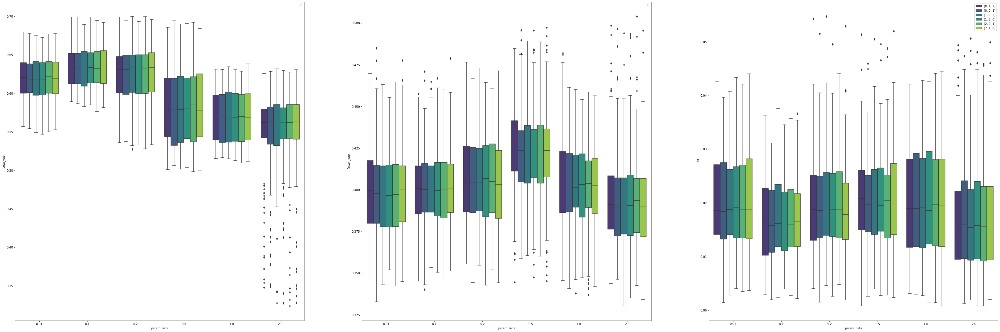

In [39]:
fig, axs = plt.subplots(1, 3, figsize=(60, 20))
sns.boxplot(data=df1, x='param_beta', y='beta_vae', hue='permutation', palette='viridis', ax=axs[0])
sns.boxplot(data=df1, x='param_beta', y='factor_vae', hue='permutation', palette='viridis', ax=axs[1])
sns.boxplot(data=df1, x='param_beta', y='mig', hue='permutation', palette='viridis', ax=axs[2])
axs[0].legend([])
axs[1].legend([])
plt.legend(loc='upper right')

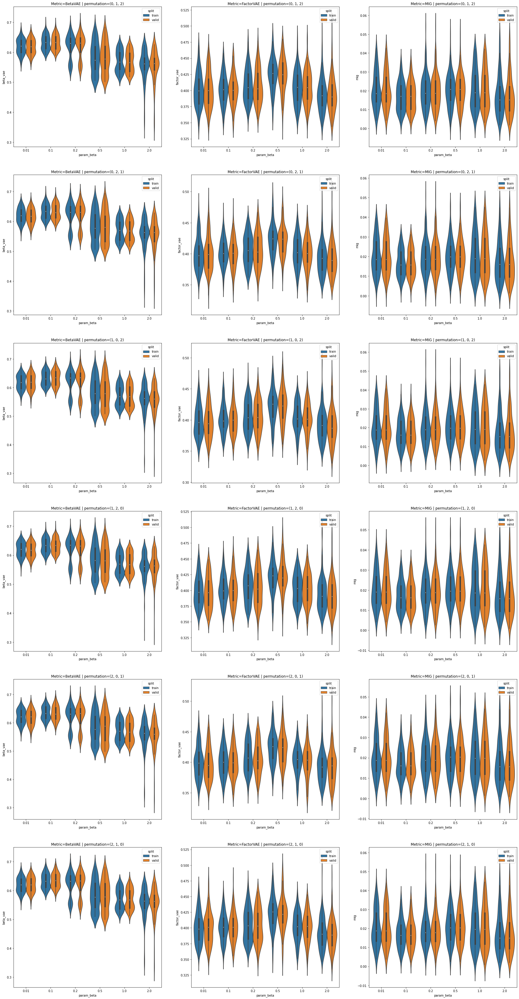

In [40]:
fig, axs = plt.subplots(6, 3, figsize=(30, 60))
axs_ = axs.ravel()
m = ['BetaVAE', 'FactorVAE', 'MIG']
for i, perm in enumerate(it.permutations(indices, len(indices))):
    for k in range(3):
        axs_[3*i+k].set_title('Metric=' + m[k] + ' | ' + 'permutation='+str(perm)) 
    sns.violinplot(data=df1[df1['permutation'] == str(perm)], x='param_beta', y='beta_vae', hue='split', ax=axs_[3*i])
    sns.violinplot(data=df1[df1['permutation'] == str(perm)], x='param_beta', y='factor_vae', hue='split', ax=axs_[3*i+1])
    sns.violinplot(data=df1[df1['permutation'] == str(perm)], x='param_beta', y='mig', hue='split', ax=axs_[3*i+2])

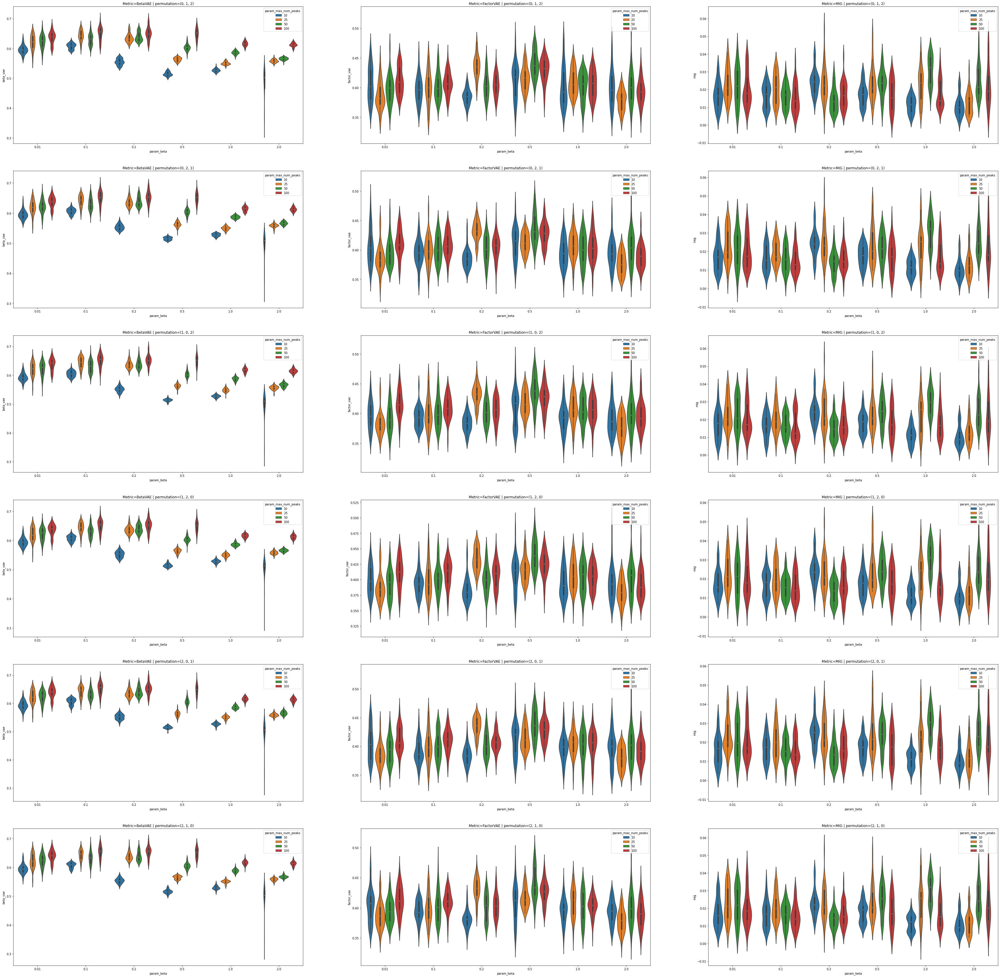

In [41]:
fig, axs = plt.subplots(6, 3, figsize=(60, 60))
axs_ = axs.ravel()
m = ['BetaVAE', 'FactorVAE', 'MIG']
for i, perm in enumerate(it.permutations(indices, len(indices))):
    for k in range(3):
        axs_[3*i+k].set_title('Metric=' + m[k] + ' | ' + 'permutation='+str(perm)) 
    sns.violinplot(data=df1[df1['permutation'] == str(perm)], x='param_beta', y='beta_vae', hue='param_max_num_peaks', ax=axs_[3*i])
    sns.violinplot(data=df1[df1['permutation'] == str(perm)], x='param_beta', y='factor_vae', hue='param_max_num_peaks', ax=axs_[3*i+1])
    sns.violinplot(data=df1[df1['permutation'] == str(perm)], x='param_beta', y='mig', hue='param_max_num_peaks', ax=axs_[3*i+2])

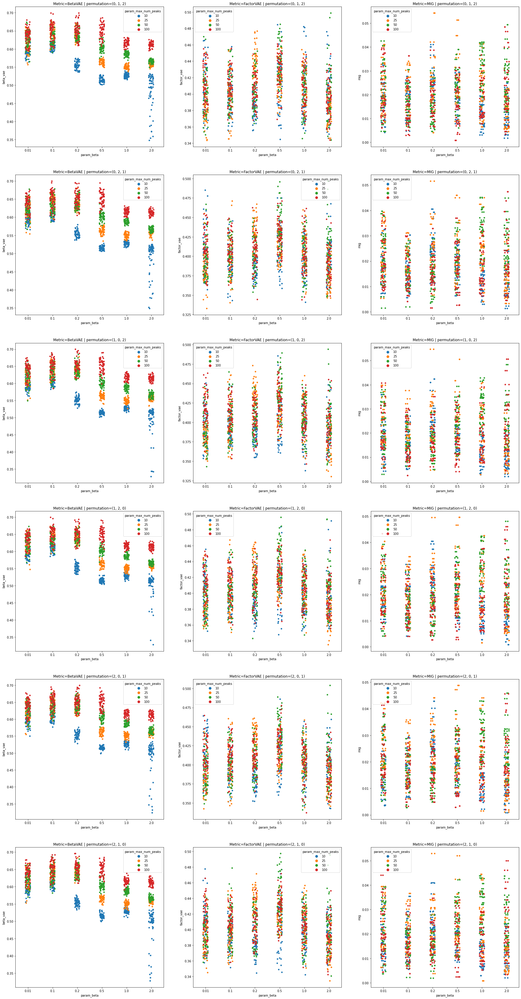

In [42]:
fig, axs = plt.subplots(6, 3, figsize=(30, 60))
axs_ = axs.ravel()
m = ['BetaVAE', 'FactorVAE', 'MIG']
for i, perm in enumerate(it.permutations(indices, len(indices))):
    for k in range(3):
        axs_[3*i+k].set_title('Metric=' + m[k] + ' | ' + 'permutation='+str(perm)) 
    sns.stripplot(data=df1[df1['permutation'] == str(perm)], x='param_beta', y='beta_vae', hue='param_max_num_peaks', ax=axs_[3*i])
    sns.stripplot(data=df1[df1['permutation'] == str(perm)], x='param_beta', y='factor_vae', hue='param_max_num_peaks', ax=axs_[3*i+1])
    sns.stripplot(data=df1[df1['permutation'] == str(perm)], x='param_beta', y='mig', hue='param_max_num_peaks', ax=axs_[3*i+2])

### Disentanglement scores rank correlation per permutation

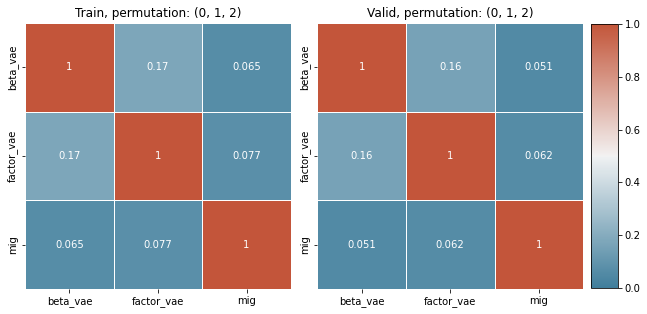

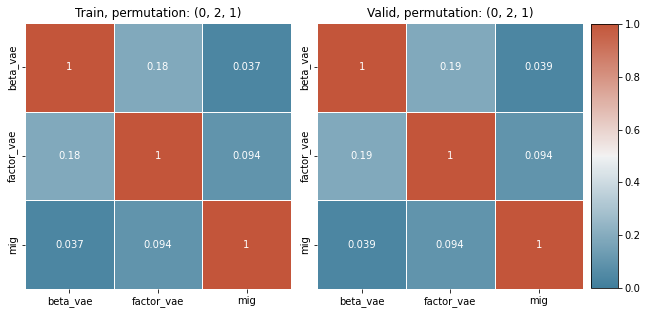

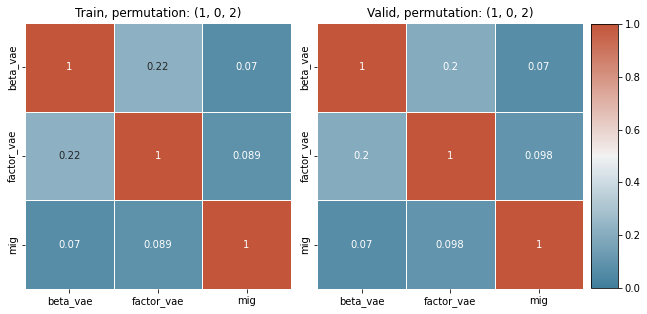

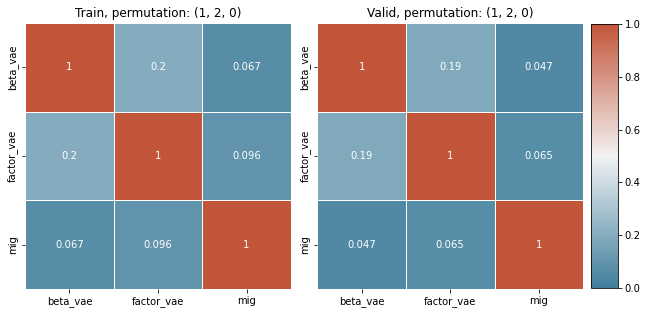

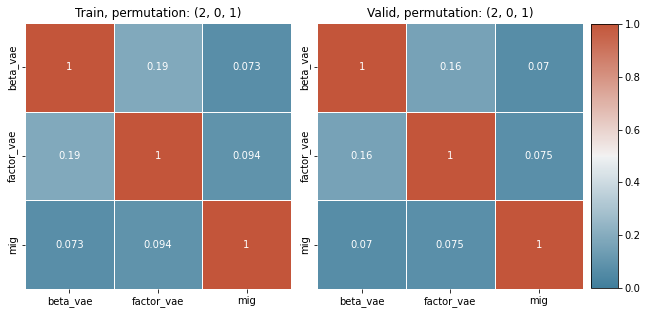

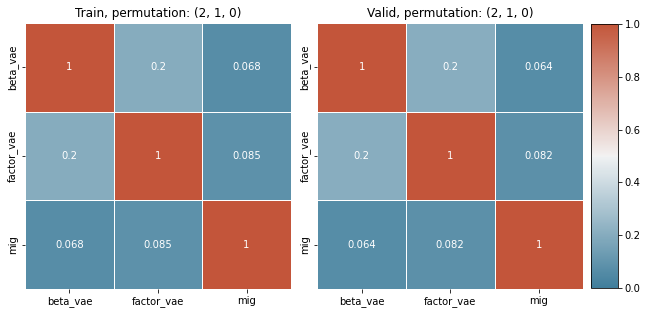

In [43]:
import scipy.stats
cmap = sns.diverging_palette(230, 20, as_cmap=True)

for perm in it.permutations(indices, len(indices)):
    dfp_train = df1[df1['permutation'].isin([str(perm)]) & df1['split'].isin(['train'])][['beta_vae', 'factor_vae', 'mig']]
    dfp_valid = df1[df1['permutation'].isin([str(perm)]) & df1['split'].isin(['valid'])][['beta_vae', 'factor_vae', 'mig']]
    c1, p1 = scipy.stats.spearmanr(dfp_train)
    c2, p2 = scipy.stats.spearmanr(dfp_valid)
    
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].set_title('Train, permutation: ' + str(perm))
    axs[1].set_title('Valid, permutation: ' + str(perm))
    sns.heatmap(c1, cmap=cmap, square=True, ax=axs[0], vmin=0.0, vmax=1.0, annot=True, linewidths=.5, center=0.5,
        xticklabels=['beta_vae', 'factor_vae', 'mig'], yticklabels=['beta_vae', 'factor_vae', 'mig'], cbar=False)
    sns.heatmap(c2, cmap=cmap, square=True, ax=axs[1], vmin=0.0, vmax=1.0, annot=True, linewidths=.5, center=0.5,
        xticklabels=['beta_vae', 'factor_vae', 'mig'], yticklabels=['beta_vae', 'factor_vae', 'mig'], cbar=False)
    fig.colorbar(axs[0].get_children()[0], ax=axs.ravel().tolist(), aspect=10., anchor=(1.6, 0.5), shrink=0.97)
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()


### Pairwise scatter plot for different disentanglement metrics

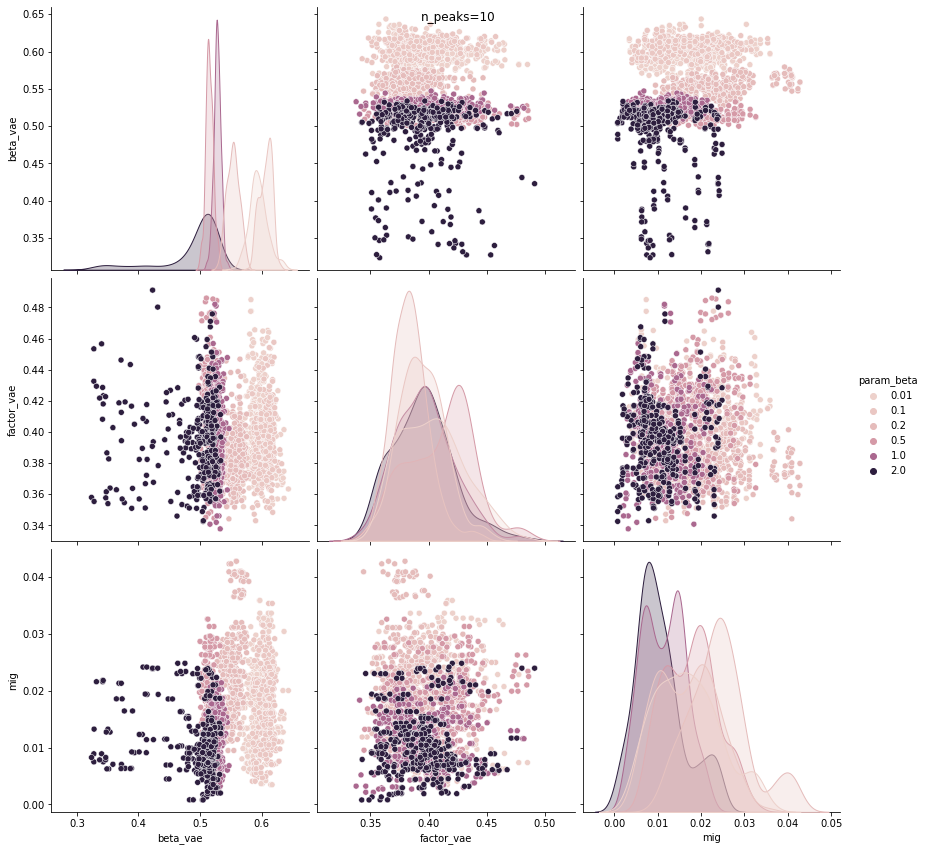

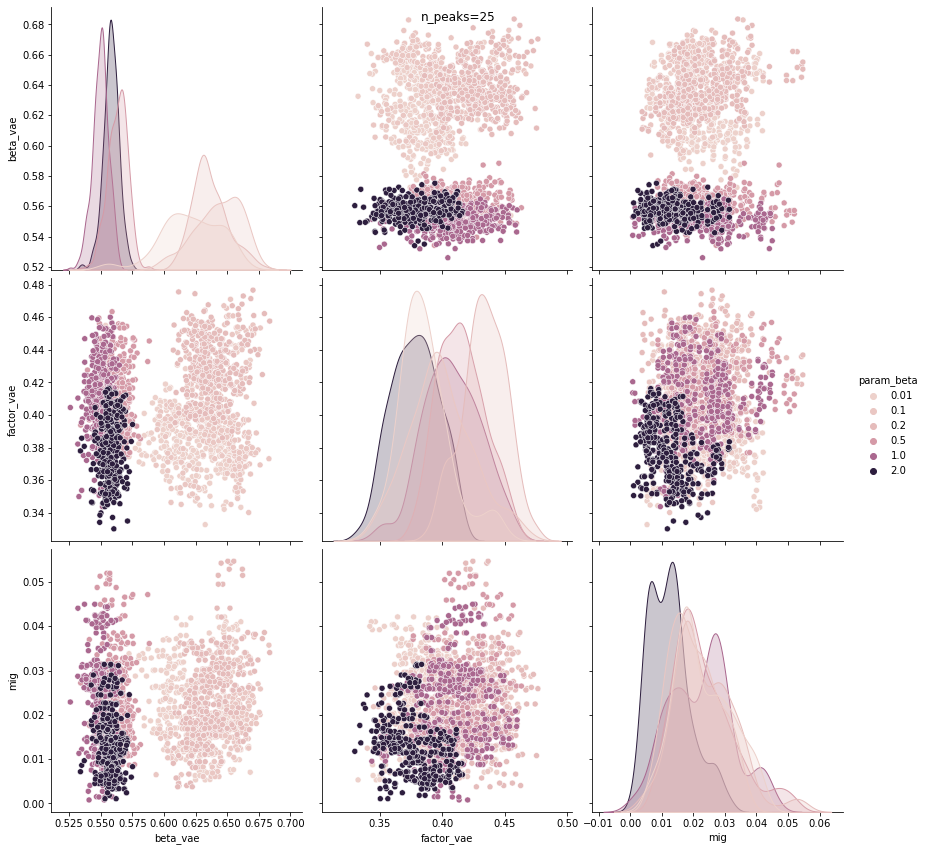

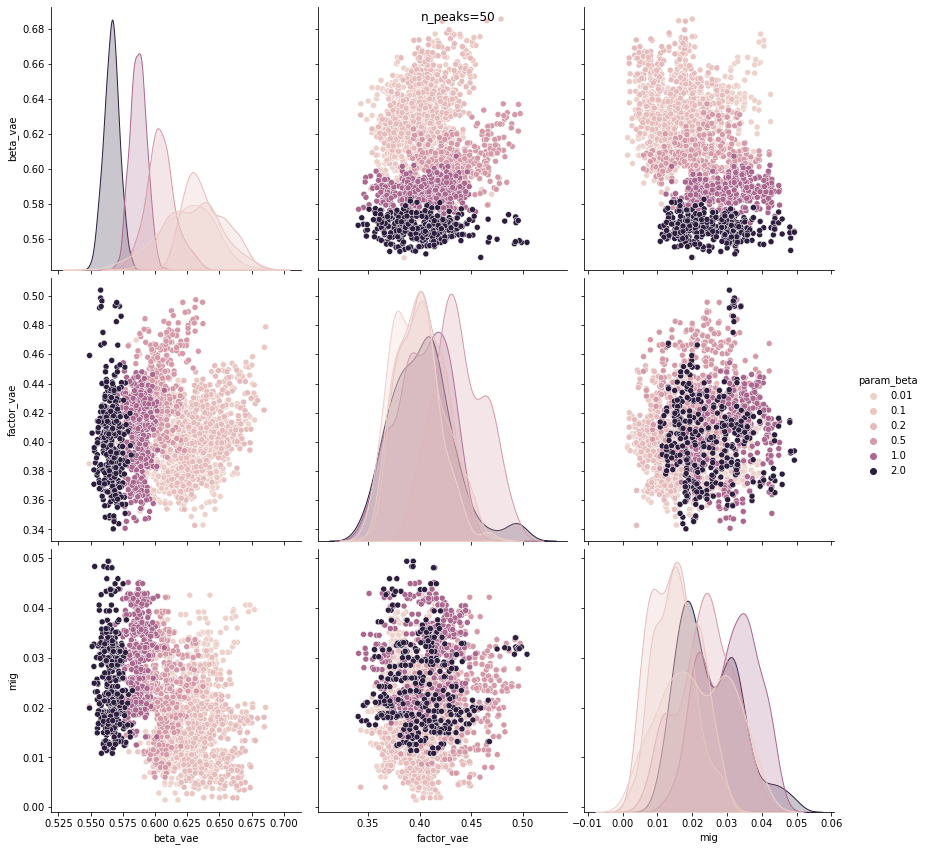

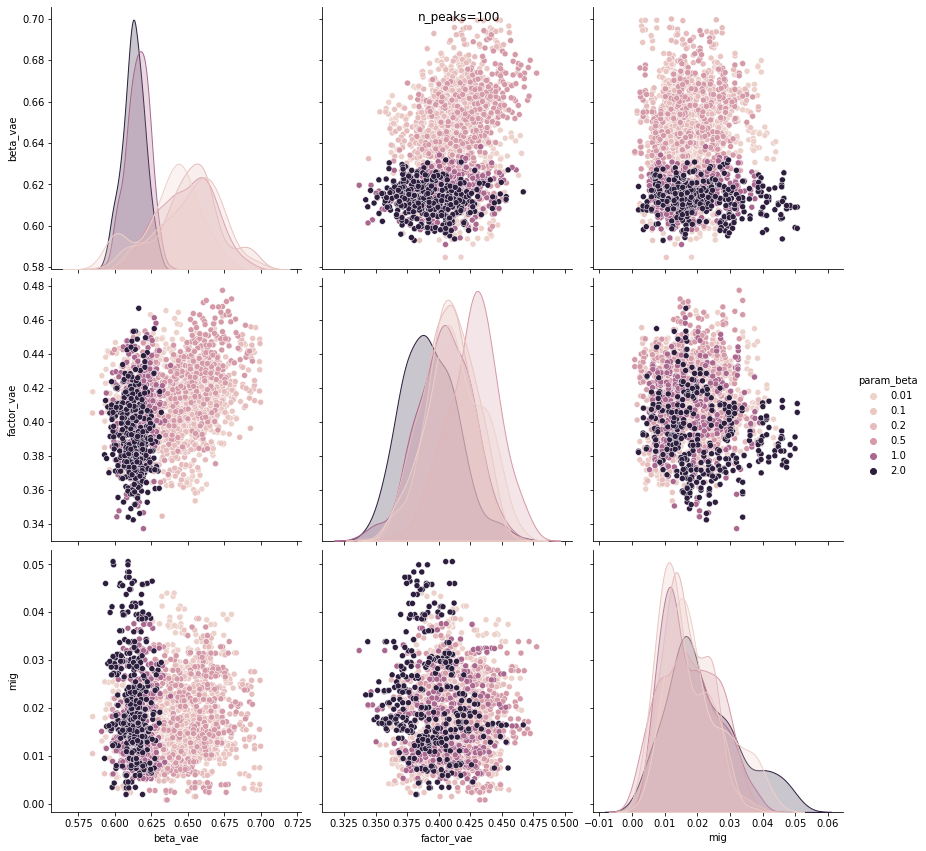

In [44]:
for n_peaks in df1['param_max_num_peaks'].unique():
    g = sns.pairplot(df1[df1['param_max_num_peaks'] == n_peaks][['beta_vae', 'factor_vae', 'mig', 'param_beta']], hue='param_beta', height=4)
    g.fig.suptitle('n_peaks=' + str(n_peaks))

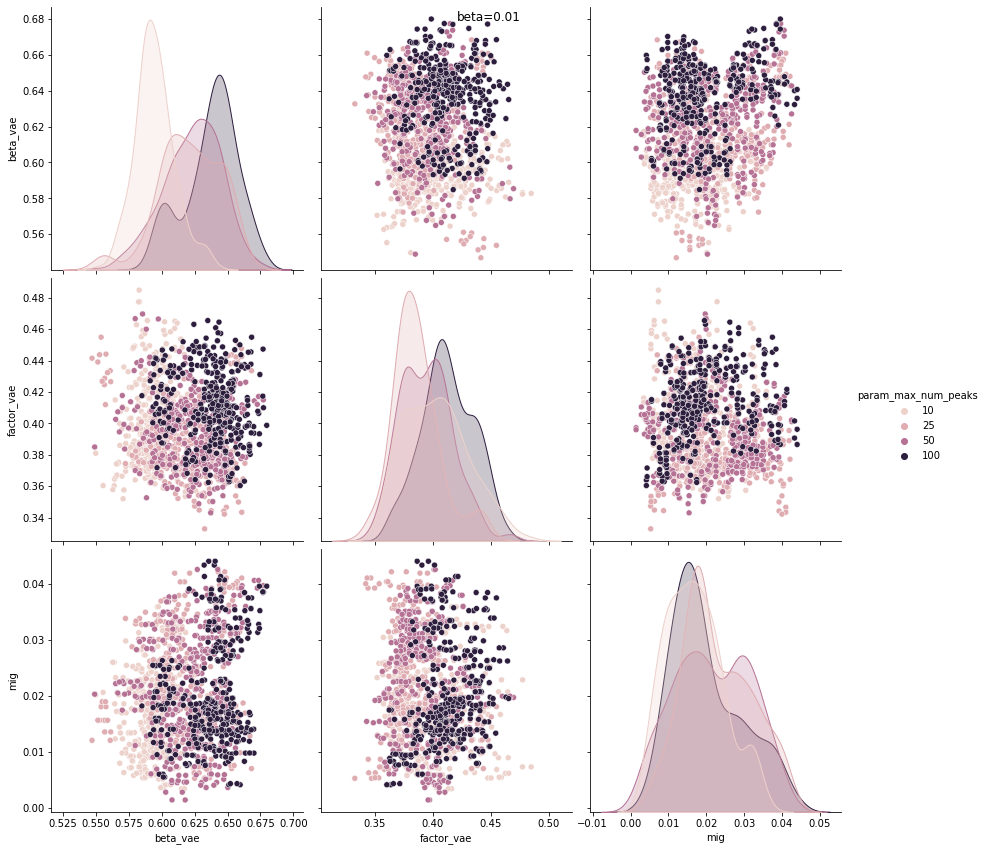

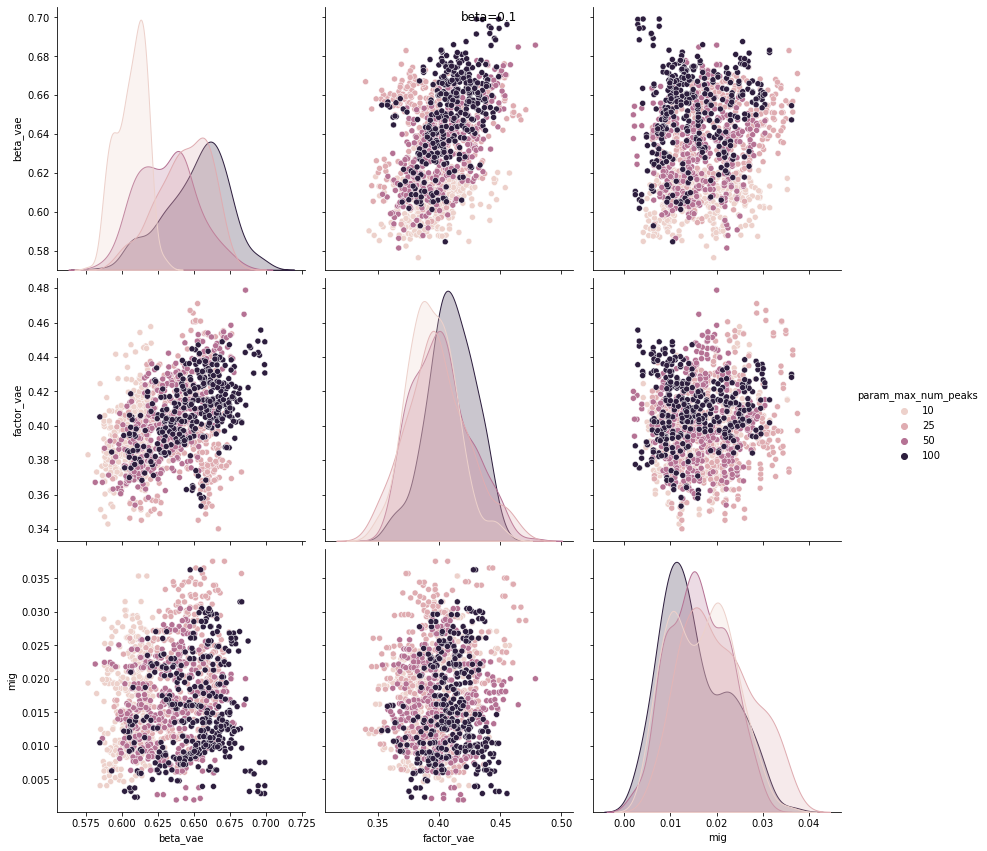

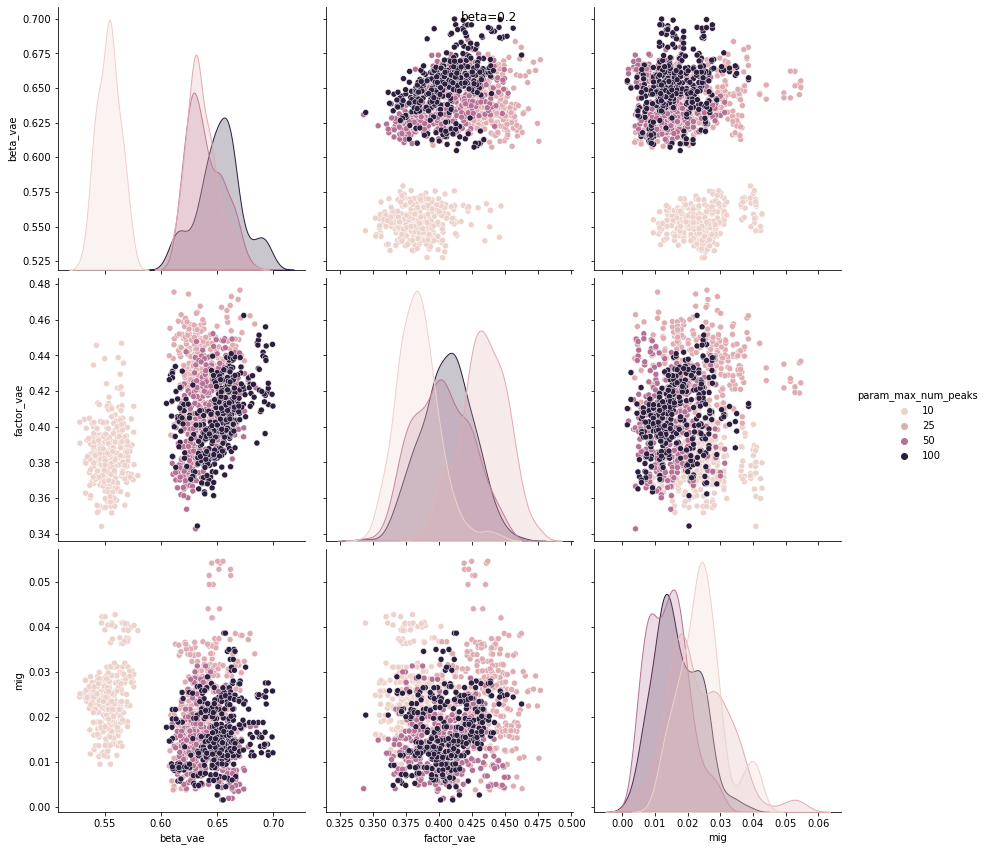

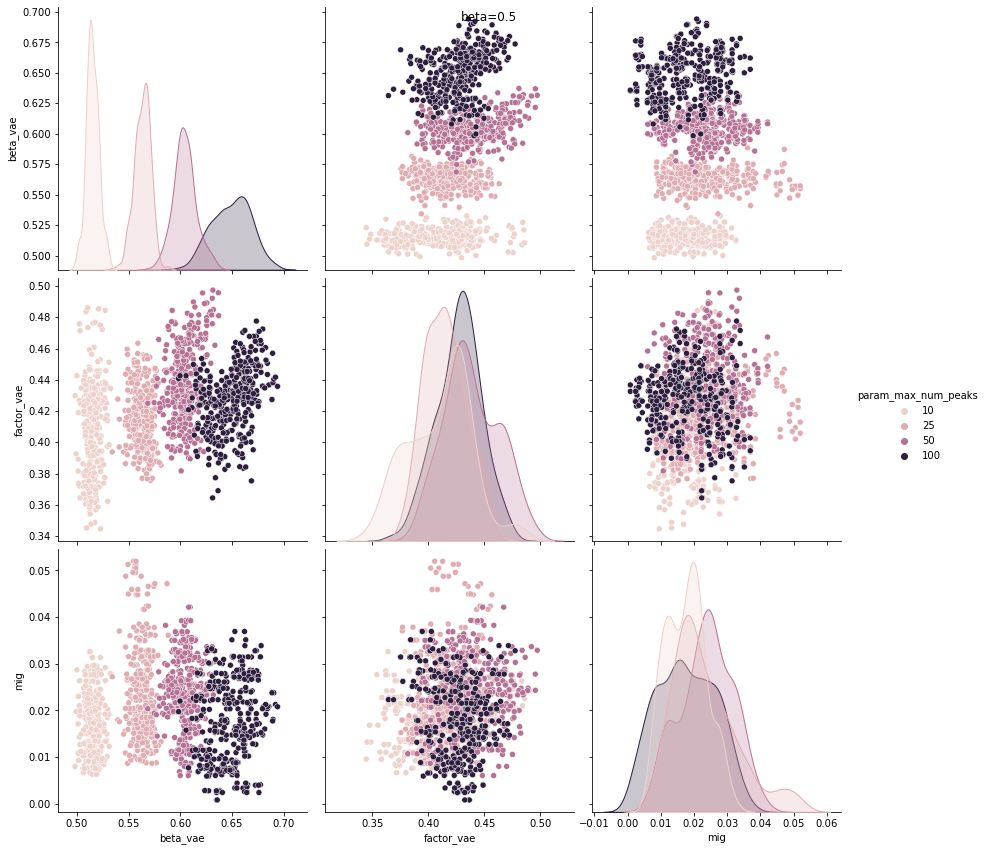

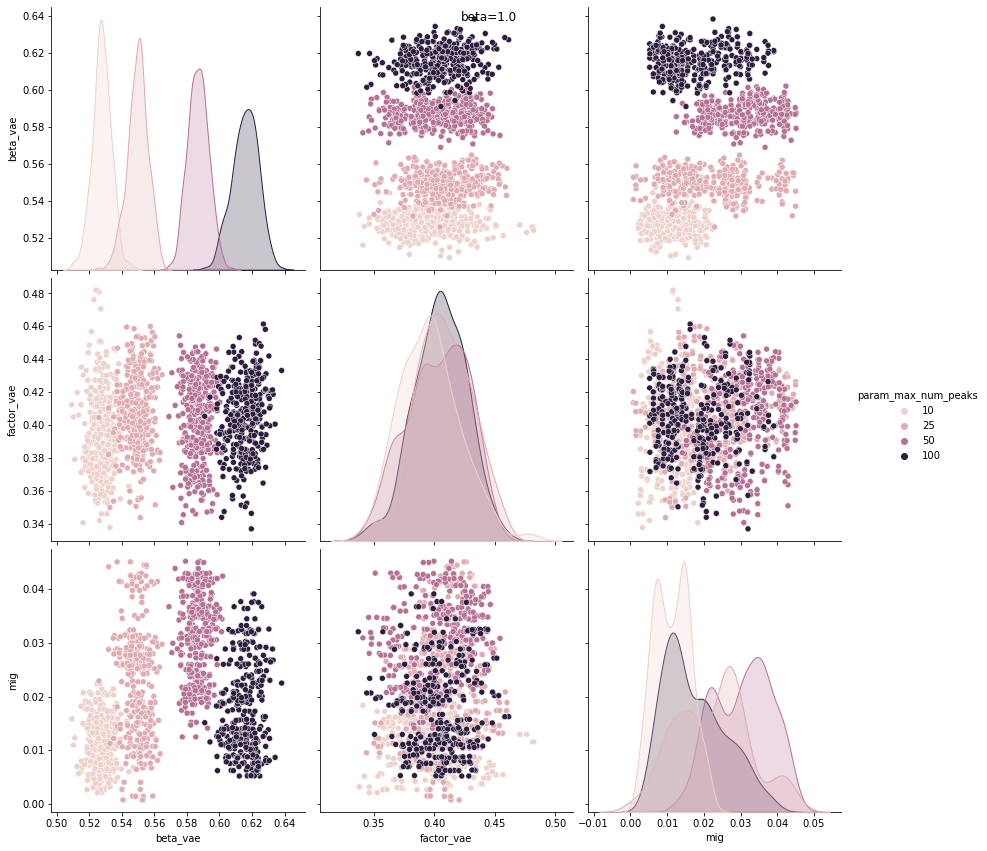

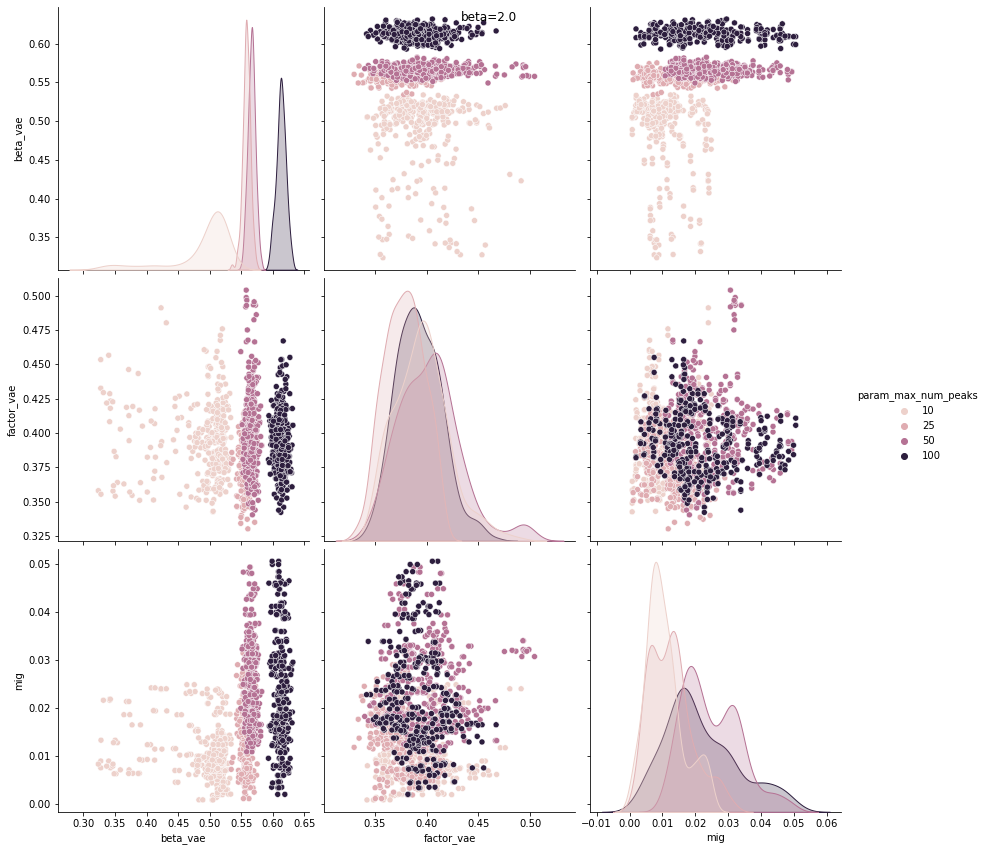

In [45]:
for beta in df1['param_beta'].unique():
    g = sns.pairplot(df1[df1['param_beta'] == beta][['beta_vae', 'factor_vae', 'mig', 'param_max_num_peaks']], hue='param_max_num_peaks', height=4)
    g.fig.suptitle('beta=' + str(beta))

### Variance of the disentanglement scores explained by different factors

#### Preprocess factors

In [46]:
# Assign categorical id to continuous variable: param_beta
param_beta_unique = df1['param_beta'].unique()
param_beta_map = dict(zip(param_beta_unique, range(len(param_beta_unique))))
df1['param_beta_id'] = df1.apply(lambda row: param_beta_map[row['param_beta']], axis=1)
param_beta_map, df1['param_beta_id'].unique()

({0.01: 0, 0.1: 1, 0.2: 2, 0.5: 3, 1.0: 4, 2.0: 5},
 array([0, 1, 2, 3, 4, 5], dtype=int64))

In [47]:
# Assign categorical id to continuous variable: n_peaks
n_peaks_unique = df1['param_max_num_peaks'].unique()
n_peaks_map = dict(zip(n_peaks_unique, range(len(n_peaks_unique))))
df1['param_max_num_peaks_id'] = df1.apply(lambda row: n_peaks_map[row['param_max_num_peaks']], axis=1)
n_peaks_map, df1['param_max_num_peaks_id'].unique()

({10: 0, 25: 1, 50: 2, 100: 3}, array([0, 1, 2, 3], dtype=int64))

In [48]:
# Assign categorical id to continuous variable: layer_config
def reduce_layer_config(row):
    layer_config = ast.literal_eval(row['layer_config'])
    encoder, decoder = layer_config[0][1:], layer_config[1][:-1]
    return str([encoder, decoder])

df1['arch'] = df1.apply(reduce_layer_config, axis=1)
arch_unique = df1['arch'].unique()
arch_map = dict(zip(arch_unique, range(len(arch_unique))))
df1['arch_id'] = df1.apply(lambda row: arch_map[row['arch']], axis=1)
arch_map, df1['arch_id'].unique()

({'[[1600, 3], [3, 1600]]': 0,
  '[[800, 3], [3, 800]]': 1,
  '[[400, 3], [3, 400]]': 2,
  '[[200, 3], [3, 200]]': 3,
  '[[100, 3], [3, 100]]': 4,
  '[[50, 3], [3, 50]]': 5,
  '[[1600, 100, 3], [3, 100, 1600]]': 6,
  '[[800, 100, 3], [3, 100, 800]]': 7,
  '[[400, 100, 3], [3, 100, 400]]': 8,
  '[[200, 100, 3], [3, 100, 200]]': 9,
  '[[100, 90, 3], [3, 90, 100]]': 10,
  '[[1600, 200, 50, 3], [3, 50, 200, 1600]]': 11,
  '[[800, 200, 50, 3], [3, 50, 200, 800]]': 12,
  '[[400, 200, 50, 3], [3, 50, 200, 400]]': 13,
  '[[200, 100, 50, 3], [3, 50, 100, 200]]': 14,
  '[[100, 90, 50, 3], [3, 50, 90, 100]]': 15,
  '[[1600, 3], [3, 100, 1600]]': 16,
  '[[800, 3], [3, 100, 800]]': 17,
  '[[400, 3], [3, 100, 400]]': 18,
  '[[300, 3], [3, 100, 300]]': 19,
  '[[200, 3], [3, 100, 200]]': 20,
  '[[100, 3], [3, 90, 100]]': 21,
  '[[50, 3], [3, 40, 50]]': 22,
  '[[1600, 100, 3], [3, 1600]]': 23,
  '[[800, 100, 3], [3, 800]]': 24,
  '[[400, 100, 3], [3, 400]]': 25,
  '[[200, 100, 3], [3, 200]]': 26,
  '[[

#### One hot encode

In [49]:
def one_hot_encode(df, name):
    id = df[name].to_numpy()
    ids = np.unique(id)
    n_values = np.max(ids) + 1
    return np.eye(n_values)[id]

In [50]:
param_beta_ohe = one_hot_encode(df1, 'param_beta_id')
n_peaks_ohe = one_hot_encode(df1, 'param_max_num_peaks_id')
arch_ohe = one_hot_encode(df1, 'arch_id')
param_beta_ohe.shape, n_peaks_ohe.shape, arch_ohe.shape

((8352, 6), (8352, 4), (8352, 29))

In [51]:
from sklearn.linear_model import LinearRegression
import sklearn.metrics as skm

def linear_regression(X, y):
    reg = LinearRegression().fit(X, y)
    y_pred = reg.predict(X)

    mse = skm.mean_squared_error(y, y_pred)
    mae = skm.mean_absolute_error(y, y_pred)
    me  = skm.max_error(y, y_pred)
    evs = skm.explained_variance_score(y, y_pred)
    return mse, mae, me, evs

In [52]:
scores = []

In [53]:
score_name = 'beta_vae'
X = np.hstack((param_beta_ohe, n_peaks_ohe, arch_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 1, 1])

X = np.hstack((param_beta_ohe, n_peaks_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 1, 0])

X = np.hstack((param_beta_ohe, arch_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 0, 1])

X = np.hstack((n_peaks_ohe, arch_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 0, 1, 1])

X = param_beta_ohe
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 0, 0])

X = n_peaks_ohe
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 0, 1, 0])

X = arch_ohe
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 0, 0, 1])

In [54]:
score_name = 'factor_vae'
X = np.hstack((param_beta_ohe, n_peaks_ohe, arch_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 1, 1])

X = np.hstack((param_beta_ohe, n_peaks_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 1, 0])

X = np.hstack((param_beta_ohe, arch_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 0, 1])

X = np.hstack((n_peaks_ohe, arch_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 0, 1, 1])

X = param_beta_ohe
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 0, 0])

X = n_peaks_ohe
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 0, 1, 0])

X = arch_ohe
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 0, 0, 1])

In [55]:
score_name = 'mig'
X = np.hstack((param_beta_ohe, n_peaks_ohe, arch_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 1, 1])

X = np.hstack((param_beta_ohe, n_peaks_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 1, 0])

X = np.hstack((param_beta_ohe, arch_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 0, 1])

X = np.hstack((n_peaks_ohe, arch_ohe))
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 0, 1, 1])

X = param_beta_ohe
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 1, 0, 0])

X = n_peaks_ohe
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 0, 1, 0])

X = arch_ohe
y = df1[score_name].to_numpy()
mse, mae, me, evs = linear_regression(X, y)
scores.append([mse, mae, me, evs, score_name, 0, 0, 1])

In [56]:
df_scores = pd.DataFrame(scores, columns=['MSE', 'MAE', 'ME', 'EVS', 'target_value', 'param_beta', 'n_peaks', 'arch'])
df_scores

,MSE,MAE,ME,EVS,target_value,param_beta,n_peaks,arch
0,0.000531,0.017042,0.181802,0.778146,beta_vae,1,1,1
1,0.000544,0.017184,0.183053,0.772596,beta_vae,1,1,0
2,0.001564,0.031050,0.230538,0.346385,beta_vae,1,0,1
3,0.001347,0.030316,0.222543,0.437013,beta_vae,0,1,1
4,0.001578,0.031264,0.232522,0.340829,beta_vae,1,0,0
5,0.001361,0.030601,0.224007,0.431495,beta_vae,0,1,0
6,0.002380,0.039883,0.271561,0.005614,beta_vae,0,0,1
7,0.000594,0.019445,0.108080,0.170175,factor_vae,1,1,1
8,0.000607,0.019700,0.108828,0.152255,factor_vae,1,1,0
9,0.000614,0.019871,0.111071,0.142362,factor_vae,1,0,1


In [57]:
index = df_scores[df_scores['target_value'] == 'beta_vae'].copy()[['param_beta', 'n_peaks', 'arch']]
beta_vae_score = df_scores[df_scores['target_value'] == 'beta_vae'].copy()[['MSE', 'MAE', 'ME', 'EVS']]
factor_vae_score = df_scores[df_scores['target_value'] == 'factor_vae'].copy()[['MSE', 'MAE', 'ME', 'EVS']]
factor_vae_score.index = beta_vae_score.index
mig_score = df_scores[df_scores['target_value'] == 'mig'].copy()[['MSE', 'MAE', 'ME', 'EVS']]
mig_score.index = factor_vae_score.index
df_scores_ = pd.concat([beta_vae_score, factor_vae_score, mig_score], axis=1, ignore_index=True)
df_scores_= df_scores_.rename(columns={
    0: "beta_vae_MSE", 1: "beta_vae_MAE", 2: 'beta_vae_ME', 3: 'beta_vae_EVS',
    4: "factor_vae_MSE", 5: "factor_vae_MAE", 6: 'factor_vae_ME', 7: 'factor_vae_EVS',
    8: "mig_MSE", 9: "mig_MAE", 10: 'mig_ME', 11: 'mig_EVS'})

for col in df_scores_.columns:
    df_scores_[col] = np.log10(df_scores_[col] + 1.)
df_scores = pd.concat([df_scores_, index], axis=1)
df_scores['config'] = 'Config'
df_scores

,beta_vae_MSE,beta_vae_MAE,beta_vae_ME,beta_vae_EVS,factor_vae_MSE,factor_vae_MAE,factor_vae_ME,factor_vae_EVS,mig_MSE,mig_MAE,mig_ME,mig_EVS,param_beta,n_peaks,arch,config
0,0.000231,0.007339,0.072545,0.249967,0.000258,0.008364,0.044571,0.068251,0.000033,0.003058,0.014981,0.052482,1,1,1,Config
1,0.000236,0.007399,0.073004,0.248610,0.000264,0.008473,0.044864,0.061548,0.000035,0.003131,0.014599,0.033686,1,1,0,Config
2,0.000679,0.013280,0.090095,0.129169,0.000267,0.008545,0.045742,0.057804,0.000035,0.003163,0.015622,0.030318,1,0,1,Config
3,0.000585,0.012970,0.087264,0.157461,0.000297,0.009045,0.039827,0.019498,0.000034,0.003114,0.015174,0.042934,0,1,1,Config
4,0.000685,0.013370,0.090795,0.127373,0.000272,0.008641,0.046028,0.050883,0.000037,0.003217,0.014978,0.010501,1,0,0,Config
5,0.000590,0.013090,0.087784,0.155790,0.000302,0.009126,0.040117,0.011901,0.000035,0.003182,0.014521,0.023708,0,1,0,Config
6,0.001032,0.016984,0.104337,0.002431,0.000305,0.009240,0.041140,0.007780,0.000036,0.003203,0.015773,0.020293,0,0,1,Config


In [58]:
# fig, axs = plt.subplots(figsize=(15, 15))
# axs.scatter(y, y_pred)
# axs.plot([np.min(y) - 0.01, np.max(y) + 0.01], [np.min(y_pred) - 0.01, np.max(y_pred) + 0.01], linestyle='dashed', color='red')

In [59]:
from specvae.visualize import multi_index_heatmap

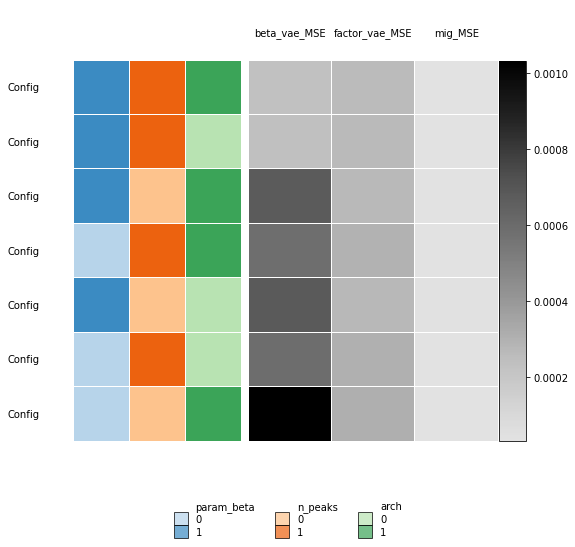

In [60]:
fig = multi_index_heatmap(df_scores,
    feature_column_name='config', 
    row_index_columns=['param_beta', 'n_peaks', 'arch'], 
    sample_columns=['beta_vae_MSE', 'factor_vae_MSE', 'mig_MSE'])

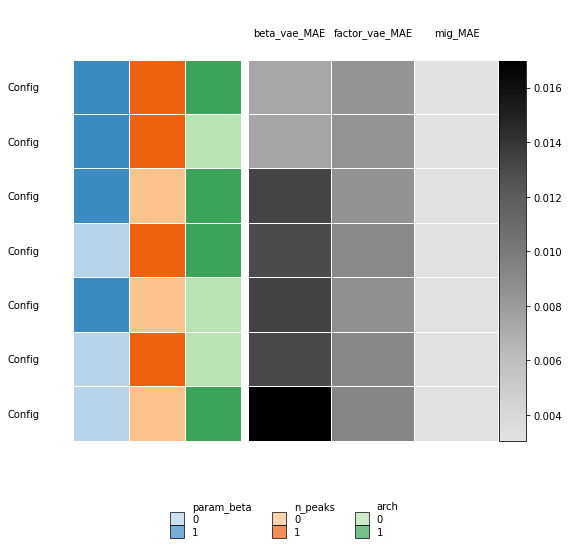

In [61]:
fig = multi_index_heatmap(df_scores,
    feature_column_name='config', 
    row_index_columns=['param_beta', 'n_peaks', 'arch'], 
    sample_columns=['beta_vae_MAE', 'factor_vae_MAE', 'mig_MAE'])

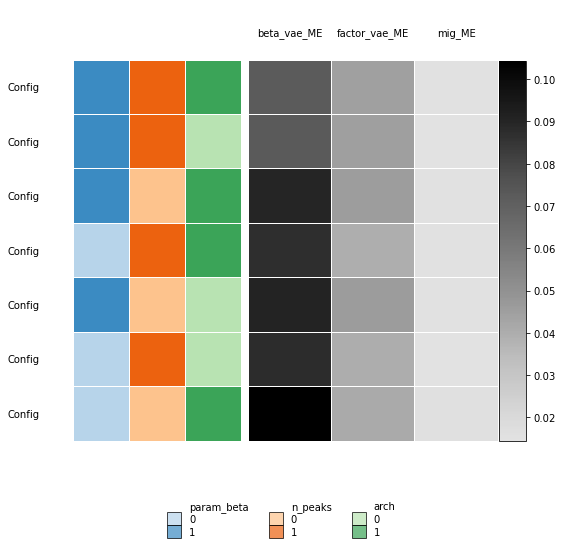

In [62]:
fig = multi_index_heatmap(df_scores,
    feature_column_name='config', 
    row_index_columns=['param_beta', 'n_peaks', 'arch'], 
    sample_columns=['beta_vae_ME', 'factor_vae_ME', 'mig_ME'])

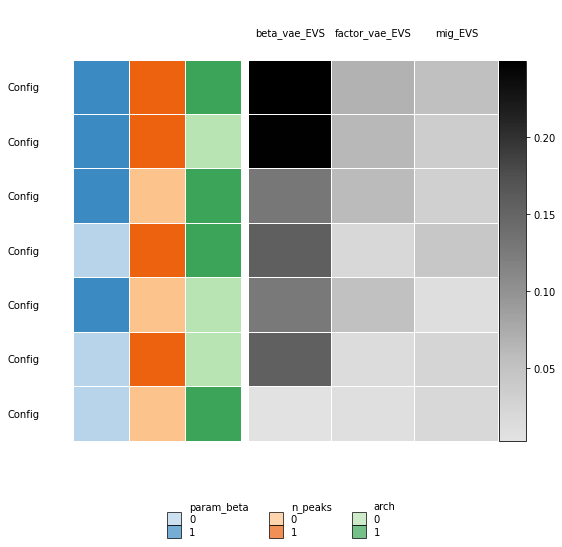

In [63]:
fig = multi_index_heatmap(df_scores,
    feature_column_name='config', 
    row_index_columns=['param_beta', 'n_peaks', 'arch'], 
    sample_columns=['beta_vae_EVS', 'factor_vae_EVS', 'mig_EVS'])